In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import warnings
warnings.filterwarnings("ignore")

# Definir rutas

In [2]:
base_path = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2"
data_path = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2"
image_path = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"

# Crear carpeta base para guardar resultados por imagen. 

Los csv de los heatmap para cada participante se guardan en la carpeta hum en la ruta: "C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo1\ **nombre_imagen** \hum" donde **nombre_imagen** puede tomar los valores "cesteria_01", "cesteria_02", "cesteria_03", "cesteria_04", "cesteria_05", "cesteria_06", "cesteria_07", "cesteria_08", "cesteria_09", "cesteria_10", "jarra_01", "jarra_02", "jarra_03", jarra_04", "jarra_05", "jarra_06", "jarra_07", "jarra_08", "jarra_09", "jarra_10"

In [3]:
def create_output_folders(image_name_no_ext):
    output_image_path = os.path.join(base_path, image_name_no_ext, "hum")
    os.makedirs(output_image_path, exist_ok=True)
    return output_image_path

# Obtener lista de imágenes

In [4]:
imagenes = [f for f in os.listdir(image_path) if f.endswith('.jpg')]
print(imagenes)

['basketry_01.jpg', 'basketry_02.jpg', 'basketry_03.jpg', 'basketry_04.jpg', 'basketry_05.jpg', 'basketry_06.jpg', 'basketry_07.jpg', 'basketry_08.jpg', 'basketry_09.jpg', 'basketry_10.jpg', 'jar_01.jpg', 'jar_02.jpg', 'jar_03.jpg', 'jar_04.jpg', 'jar_05.jpg', 'jar_06.jpg', 'jar_07.jpg', 'jar_08.jpg', 'jar_09.jpg', 'jar_10.jpg']


#  Definición de una función para visualizar heatmaps de cada imagen por cada participante y una función para crear los csv de cada heatmap

1️⃣ ``create_heatmap()``

Esta función crea un heatmap (mapa de calor) de la fijación ocular a partir de los datos de seguimiento ocular (eye-tracking). Toma como entrada un archivo CSV con las coordenadas normalizadas de la mirada de los participantes y genera un mapa de calor ponderado por el nivel de confianza de la medición.


Carga la imagen de fondo: Utiliza plt.imread(cover_img) para leer la imagen sobre la cual se generará el heatmap.
Carga los datos del participante: Lee el archivo CSV que contiene información de la mirada, que incluye:
x_norm: Coordenada normalizada en el eje X.
y_norm: Coordenada normalizada en el eje Y (invertida para ajustar al sistema de coordenadas de imágenes).
confidence: Nivel de confianza de la medición.
Crea un histograma ponderado:
Se genera una matriz (hist) del tamaño de la imagen.
Se recorren los datos del CSV y, en cada punto (x, y), se suma el valor de confidence en la matriz.
Aplica un filtro gaussiano para suavizar el heatmap.
Normaliza el heatmap para escalarlo entre 0 y 1, evitando divisiones por cero.
Guarda el heatmap como un archivo CSV con los valores de la matriz generada.

Devuelve la matriz hist_normalized, que representa el heatmap generado.

2️⃣ ``create_participant_grid()``

Esta función crea una imagen con una cuadrícula de heatmaps de varios participantes, superponiéndolos sobre la imagen original.

Carga la imagen de fondo.
Calcula la cantidad de filas y columnas necesarias para organizar las imágenes en una cuadrícula.
Genera los gráficos:
Para cada heatmap en la lista, lo superpone sobre la imagen original utilizando cmap='jet' para visualizar las zonas más observadas en rojo y las menos observadas en azul.
Se desactivan los ejes y se asignan títulos para identificar cada muestra.
Guarda la imagen generada con la cuadrícula de heatmaps en un archivo .png.

In [5]:
def create_heatmap(surface_df, csv_file, cover_img, output_folder):
    """
    Crea un heatmap ponderando por confidence y aplicando un filtro gaussiano.

    Args:
        surface_df (str): Ruta al archivo CSV con los datos de fijación ocular.
        csv_file (str): Nombre del archivo CSV del participante.
        cover_img (str): Ruta a la imagen original.
        output_folder (str): Carpeta donde se guardarán los resultados.

    Returns:
        np.ndarray: Matriz del histograma representando el heatmap.
    """
    cover_img = plt.imread(cover_img)
    gaze_on_surf = pd.read_csv(surface_df)

    grid = cover_img.shape[0:2]  # height, width of the loaded image

    gaze_on_surf_x = gaze_on_surf['x_norm']
    gaze_on_surf_y = 1 - gaze_on_surf['y_norm']  # Ajustar sistema de coordenadas
    confidence = gaze_on_surf['confidence']  # Columna de ponderación

    # Crear el histograma ponderado
    hist = np.zeros(grid)
    for x, y, w in zip(gaze_on_surf_x, gaze_on_surf_y, confidence):
        ix, iy = int(x * grid[1]), int(y * grid[0])
        if 0 <= ix < grid[1] and 0 <= iy < grid[0]:
            hist[iy, ix] += w

    # Aplicar un filtro gaussiano para resaltar las fijaciones
    hist_smoothed = gaussian_filter(hist, sigma=10)

    # Normalizar el histograma suavizado
    #hist_normalized = (hist_smoothed - np.min(hist_smoothed)) / (np.max(hist_smoothed) - np.min(hist_smoothed) + 1e-6)
    min_val, max_val = np.min(hist_smoothed), np.max(hist_smoothed)
    if max_val - min_val > 0:
        hist_normalized = (hist_smoothed - min_val) / (max_val - min_val)
    else:
        hist_normalized = np.zeros_like(hist_smoothed)  # Evitar división por 0


    # Guardar el histograma como CSV
    csv_file_path = os.path.join(output_folder, f"reminder_heatmap_{csv_file[:-4]}.csv")
    np.savetxt(csv_file_path, hist_normalized, delimiter=',')
    print(f"CSV del heatmap guardado en {csv_file_path}")

    return hist_normalized

def create_participant_grid(image_name_no_ext, cover_img, heatmaps, output_folder):
    """
    Genera una cuadrícula de heatmaps para los participantes y la guarda como una imagen.

    Args:
        image_name_no_ext (str): Nombre de la imagen sin extensión.
        cover_img (str): Ruta a la imagen original.
        heatmaps (list): Lista de matrices de heatmaps de los participantes.
        output_folder (str): Carpeta donde se guardará el resultado.
    """
    cover_img = plt.imread(cover_img)
    num_participants = len(heatmaps)
    cols = 8  # Número de columnas en la cuadrícula
    rows = (num_participants + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    axes = axes.flatten()

    for i, heatmap in enumerate(heatmaps):
        axes[i].imshow(cover_img, alpha=0.5)
        axes[i].imshow(heatmap, cmap='jet', alpha=0.5)
        axes[i].set_title(f"Muestra {i + 1}")
        axes[i].axis('off')

    for j in range(len(heatmaps), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    
    # Asegurar existencia de la carpeta de salida
    os.makedirs(output_folder, exist_ok=True)

    output_file = os.path.join(output_folder, f"grid_heatmaps_{image_name_no_ext}.png")
    plt.savefig(output_file, dpi=300)
    plt.show()
    plt.close()
    print(f"Grid de heatmaps guardado en {output_file}")


## Generar heatmaps para todas las imágenes

1️⃣ Para cada imagen en imagenes:

2️⃣ Verifica que la imagen existe.

3️⃣ Busca la carpeta con los datos CSV de eye-tracking.

4️⃣ Si no hay datos, pasa a la siguiente imagen.

5️⃣ Crea una carpeta de salida para guardar resultados.

6️⃣ Busca archivos CSV dentro de la carpeta de datos.

7️⃣ Si hay archivos CSV, genera heatmaps individuales.

8️⃣ Crea una cuadrícula de heatmaps y la guarda.

In [6]:
for img in imagenes:
    image_file = os.path.join(image_path, img)
    if not os.path.exists(image_file):
        print(f"Imagen no encontrada: {image_file}")
        continue

    image_name_no_ext = os.path.splitext(img)[0]
    image_folder = os.path.join(data_path, image_name_no_ext, "pupil_data")

    if not os.path.exists(image_folder):
        print(f"Carpeta de datos no encontrada: {image_folder}")
        continue

    output_folder = create_output_folders(image_name_no_ext)

    csv_files = [f for f in os.listdir(image_folder) if f.endswith('.csv')]
    if not csv_files:
        print(f"No se encontraron archivos CSV en {image_folder}")
        continue

    heatmaps = []
    for csv_file in csv_files:
        csv_path = os.path.join(image_folder, csv_file)
        hist = create_heatmap(csv_path, csv_file, image_file, output_folder)
        heatmaps.append(hist)

    create_participant_grid(image_name_no_ext, image_file, heatmaps, output_folder)


Carpeta de datos no encontrada: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2\basketry_01\pupil_data
Carpeta de datos no encontrada: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2\basketry_02\pupil_data
Carpeta de datos no encontrada: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2\basketry_03\pupil_data
Carpeta de datos no encontrada: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2\basketry_04\pupil_data
Carpeta de datos no encontrada: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2\basketry_05\pupil_data
Carpeta de datos no encontrada: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2\basketry_06\pupil_data
Carpeta de datos no encontrada: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\

# Aplicar **MEAN SHIFT**
Esto lo hago para encontrar la cantidad de distribuciones óptimas en los mapas de calor. Como resultado entrega coordenadas de centros de masa. 

Este código aplica el algoritmo Mean Shift para detectar exactamente 3 clústeres en datos de eye-tracking.

1️⃣ Carga datos de seguimiento ocular desde un archivo CSV.

2️⃣ Filtra los datos, quedándose solo con puntos donde la mirada está sobre la superficie (on_surf == True).

3️⃣ Extrae coordenadas normalizadas (x_norm, y_norm).

4️⃣ Aplica Mean Shift para agrupar los puntos en 3 clústeres.

5️⃣ Ajusta automáticamente el parámetro bandwidth:

   * Si hay más de 3 clústeres, aumenta bandwidth.

   * Si hay menos de 3, disminuye bandwidth.

   * Repite este ajuste hasta encontrar exactamente 3 clústeres (máx. 100 intentos).

6️⃣ Devuelve las etiquetas de los clústeres asignadas a cada punto.



Primero un ejemplo con la imagen 8 y participante M37q2_output_18 y luego generalizado

In [7]:
import numpy as np
import pandas as pd
from sklearn.cluster import MeanShift
import os

def mean_shift_fixed_clusters(data, bandwidth=0.1, max_iter=100):
    """
    Aplica Mean Shift y ajusta el bandwidth para forzar 3 clústeres.

    Args:
        data (pd.DataFrame): Datos originales con columnas `x_norm`, `y_norm`, y `on_surf`.
        bandwidth (float): Valor inicial del bandwidth.
        max_iter (int): Número máximo de intentos para encontrar 3 clústeres.

    Returns:
        np.ndarray: Etiquetas de cluster para cada punto en los datos.
    """
    # Filtrar datos donde la mirada está en la superficie
    filtered_data = data[data['on_surf'] == True]

    # Extraer coordenadas
    coords = filtered_data[['x_norm', 'y_norm']].to_numpy()

    if coords.shape[0] == 0:
        print("No hay datos válidos después del filtrado.")
        return None

    # Ajustar bandwidth para obtener 3 clústeres
    for _ in range(max_iter):
        mean_shift = MeanShift(bandwidth=bandwidth, bin_seeding=True)
        mean_shift.fit(coords)

        num_clusters = len(np.unique(mean_shift.labels_))
        if num_clusters == 3:
            print(f"Se encontraron exactamente 3 clústeres con bandwidth = {bandwidth}")
            return mean_shift.labels_

        # Ajustar el bandwidth dinámicamente si el número de clústeres no es 3
        if num_clusters > 3:
            bandwidth *= 1.1  # Aumentar bandwidth si hay demasiados clústeres
        else:
            bandwidth *= 0.9  # Disminuir bandwidth si hay muy pocos clústeres

    print("No se pudo encontrar exactamente 3 clústeres después de los ajustes.")
    return None


# Cargar el archivo CSV proporcionado
csv_file_path = r'C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2\jarra_08\pupil_data\uzVao_output_18.csv'
data_original = pd.read_csv(csv_file_path)

# Aplicar Mean Shift ajustado a los datos originales
cluster_labels = mean_shift_fixed_clusters(data_original)

if cluster_labels is not None:
    print(f"Etiquetas de los clusters asignadas: {cluster_labels}")


Se encontraron exactamente 3 clústeres con bandwidth = 0.11000000000000001
Etiquetas de los clusters asignadas: [0 0 0 ... 1 1 1]


## Lo mismo que se hizo en la parte anterior pero ahora mostrando el gráfico

Se encontraron exactamente 3 clústeres con bandwidth = 0.10935000000000002


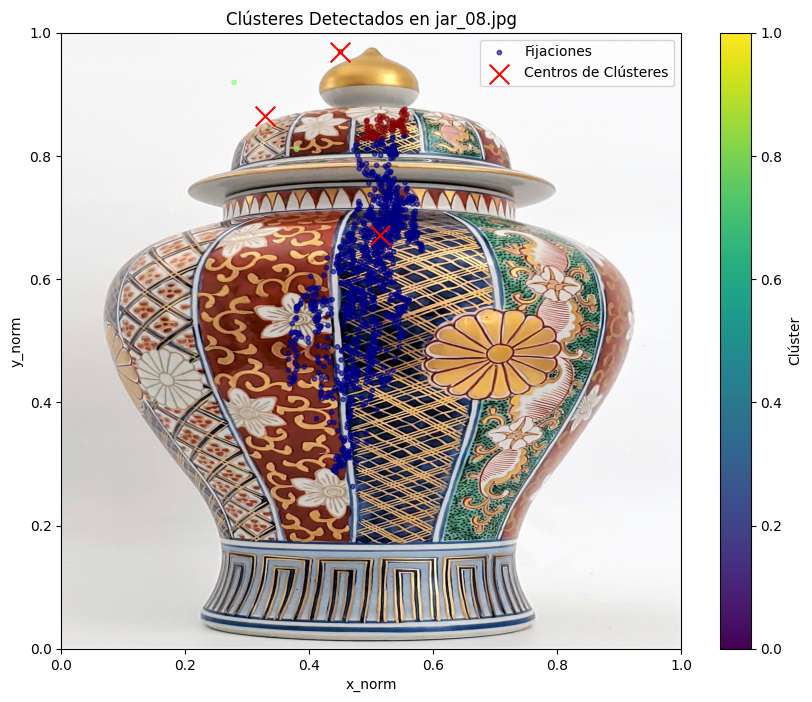

In [10]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift

nombre_imagen = "jar_08"  # Cambia esto por el nombre de la imagen/carpeta que desees
nombre_archivo = "M37q2_output_18"  # Cambia esto por el archivo CSV específico

# 🔹 Rutas base dinámicas
image_path = rf"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001\{nombre_imagen}.jpg"
data_folder = rf"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2\{nombre_imagen}\pupil_data"

# 🔹 Buscar el archivo CSV en la carpeta
csv_files = [f for f in os.listdir(data_folder) if nombre_archivo in f and f.endswith('.csv')]
if not csv_files:
    raise FileNotFoundError(f"No se encontró el archivo de {nombre_archivo} en la carpeta especificada: {data_folder}")

csv_file_path = os.path.join(data_folder, csv_files[0])

# 🔹 Cargar el archivo CSV
data_original = pd.read_csv(csv_file_path)

# 🔹 Verificar que la columna 'on_surf' existe
if 'on_surf' not in data_original.columns:
    raise ValueError("Error: La columna 'on_surf' no está en el archivo CSV.")

# 🔹 Convertir 'on_surf' a booleano si está en formato texto
data_original['on_surf'] = data_original['on_surf'].astype(str).str.lower() == 'true'

# 🔹 Filtrar datos donde la mirada está en la superficie
filtered_data = data_original[data_original['on_surf']]
if filtered_data.empty:
    raise ValueError("No hay datos con 'on_surf == True'.")

# 🔹 Extraer coordenadas
coords = filtered_data[['x_norm', 'y_norm']].to_numpy()

# 🔹 **Forzar exactamente 3 clústeres con Mean Shift**
bandwidth = 0.15  # Valor inicial
desired_clusters = 3
max_iter = 100  # Máximo de intentos

for _ in range(max_iter):
    mean_shift = MeanShift(bandwidth=bandwidth, bin_seeding=True)
    mean_shift.fit(coords)

    num_clusters = len(np.unique(mean_shift.labels_))
    if num_clusters == desired_clusters:
        print(f"Se encontraron exactamente 3 clústeres con bandwidth = {bandwidth}")
        break

    # Ajustar dinámicamente el bandwidth
    if num_clusters > desired_clusters:
        bandwidth *= 1.1  # Aumentar si hay demasiados clústeres
    else:
        bandwidth *= 0.9  # Reducir si hay pocos clústeres

# 🔹 **Graficar los Clústeres sobre la Imagen**
def plot_clusters_on_image_as_heatmap(data, mean_shift, image_path):
    """
    Grafica los clústeres detectados sobre la imagen original.
    """
    filtered_data = data[data['on_surf']]
    coords = filtered_data[['x_norm', 'y_norm']].to_numpy()
    labels = mean_shift.labels_
    cluster_centers = mean_shift.cluster_centers_
    image = plt.imread(image_path)

    plt.figure(figsize=(10, 8))
    plt.imshow(image, extent=(0, 1, 0, 1), aspect='auto')
    plt.scatter(coords[:, 0], coords[:, 1], c=labels, cmap='jet', s=10, alpha=0.6, label="Fijaciones")
    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', marker='x', s=200, label="Centros de Clústeres")
    plt.colorbar(label="Clúster")
    plt.title(f"Clústeres Detectados en {nombre_imagen}.jpg")
    plt.xlabel("x_norm")
    plt.ylabel("y_norm")
    plt.legend()
    plt.grid(False)
    
    plt.show()  # MOSTRAR la imagen en vez de guardarla

# 🔹 Mostrar el heatmap en pantalla
plot_clusters_on_image_as_heatmap(data_original, mean_shift, image_path)


## Imagen del heatmap con los centros de masa y los cluster obtenidos en el mean shift

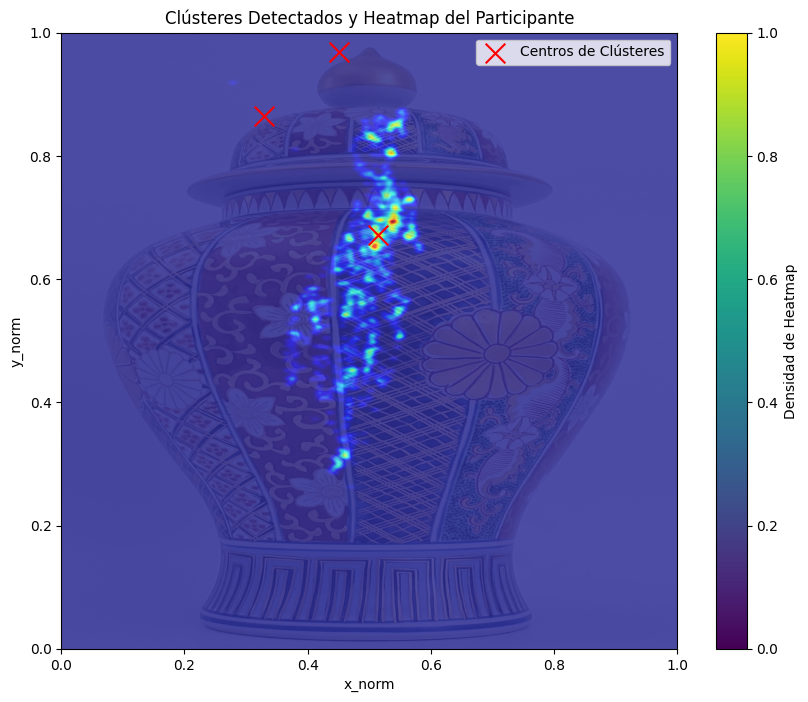

In [11]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift

def plot_clusters_with_participant_heatmap(data, mean_shift, heatmap_path, image_path):
    """
    Grafica los clústeres detectados por Mean Shift sobre el heatmap del participante y la imagen original.

    Args:
        data (pd.DataFrame): Datos originales filtrados.
        mean_shift (MeanShift): Modelo de Mean Shift entrenado.
        heatmap_path (str): Ruta al heatmap generado del participante.
        image_path (str): Ruta a la imagen original.
    """
    # Verificar si el heatmap existe
    if not os.path.exists(heatmap_path):
        raise FileNotFoundError(f"No se encontró el archivo del heatmap en {heatmap_path}")

    # Filtrar datos donde la mirada está en la superficie
    filtered_data = data[data['on_surf'] == True]

    # Extraer coordenadas y etiquetas
    coords = filtered_data[['x_norm', 'y_norm']].to_numpy()
    labels = mean_shift.labels_
    cluster_centers = mean_shift.cluster_centers_

    # Cargar la imagen original
    image = plt.imread(image_path)

    # Cargar el heatmap del participante
    participant_heatmap = pd.read_csv(heatmap_path, header=None).to_numpy()

    # Normalizar el heatmap para mejorar visualización
    heatmap_min = participant_heatmap.min()
    heatmap_max = participant_heatmap.max()
    participant_heatmap = (participant_heatmap - heatmap_min) / (heatmap_max - heatmap_min + 1e-6)  # Evitar divisiones por 0

    # Crear el gráfico
    plt.figure(figsize=(10, 8))
    plt.imshow(image, extent=(0, 1, 0, 1), aspect='auto', alpha=0.5)  # Mostrar la imagen original con transparencia
    plt.imshow(participant_heatmap, cmap='jet', extent=(0, 1, 0, 1), alpha=0.7)  # Superponer el heatmap del participante
    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', marker='x', s=200, label='Centros de Clústeres')
    plt.colorbar(label="Densidad de Heatmap")
    plt.title("Clústeres Detectados y Heatmap del Participante")
    plt.xlabel("x_norm")
    plt.ylabel("y_norm")
    plt.legend()
    plt.grid(False)
    plt.show()

# 🔹 Configurar rutas de los archivos
nombre_imagen = "jarra_08"  # Cambia esto por el nombre de la imagen/carpeta
nombre_archivo = "reminder_heatmap_M37q2_output_18"  # Cambia esto por el archivo CSV específico

# Ruta base
heatmap_path = rf"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2\{nombre_imagen}\hum\{nombre_archivo}.csv"

# 🔹 Graficar los clústeres con el heatmap del participante de fondo
plot_clusters_with_participant_heatmap(data_original, mean_shift, heatmap_path, image_path)


# Mean Shift Generalizado

In [13]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.neighbors import KernelDensity

def mean_shift_with_dynamic_bandwidth(data, factor=1.0):
    """
    Aplica Mean Shift con un bandwidth dinámico y devuelve los clústeres detectados.
    """
    if "on_surf" not in data.columns or "x_norm" not in data.columns or "y_norm" not in data.columns:
        print(f"⚠️ Advertencia: El archivo CSV no tiene las columnas requeridas.")
        return None, 0

    filtered_data = data[data['on_surf'] == True]
    coords = filtered_data[['x_norm', 'y_norm']].to_numpy()

    bandwidth = estimate_bandwidth(coords, quantile=0.2, n_samples=min(500, len(coords)))
    bandwidth = max(bandwidth * factor, 0.01)

    mean_shift = MeanShift(bandwidth=bandwidth)
    mean_shift.fit(coords)

    num_clusters = len(np.unique(mean_shift.labels_))
    
    return mean_shift, num_clusters

def save_clusters_to_csv(data, mean_shift, output_csv_path):
    """
    Guarda los clústeres detectados en un archivo CSV.
    """
    filtered_data = data[data['on_surf'] == True]
    coords = filtered_data[['x_norm', 'y_norm']].to_numpy()
    labels = mean_shift.labels_
    cluster_centers = mean_shift.cluster_centers_

    cluster_data = pd.DataFrame({
        "x_norm": coords[:, 0],
        "y_norm": coords[:, 1],
        "cluster": labels
    })

    cluster_centers_df = pd.DataFrame(cluster_centers, columns=["x_norm", "y_norm"])
    cluster_centers_df["cluster"] = range(len(cluster_centers))

    final_df = pd.concat([cluster_data, cluster_centers_df], ignore_index=True)
    final_df.to_csv(output_csv_path, index=False)
    print(f"📁 CSV de clústeres guardado: {output_csv_path}")

def plot_and_save_clusters(data, mean_shift, image_path, output_path, image_alpha=0.2):
    """
    Genera un gráfico de los clústeres detectados y lo guarda.
    """
    filtered_data = data[data['on_surf'] == True]
    coords = filtered_data[['x_norm', 'y_norm']].to_numpy()

    labels = mean_shift.labels_
    cluster_centers = mean_shift.cluster_centers_

    image = plt.imread(image_path)
    x_grid, y_grid = np.meshgrid(np.linspace(0, 1, 500), np.linspace(0, 1, 500))
    grid_coords = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

    kde = KernelDensity(bandwidth=0.05).fit(coords)
    density = np.exp(kde.score_samples(grid_coords)).reshape(x_grid.shape)

    plt.figure(figsize=(10, 8))
    plt.imshow(image, extent=(0, 1, 0, 1), aspect='auto', alpha=image_alpha)
    plt.contour(x_grid, y_grid, density, levels=10, cmap='jet', alpha=0.8)
    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', marker='x', s=200, label='Centros de Clústeres')
    plt.title("Clústeres Detectados con Curvas de Nivel")
    plt.xlabel("x_norm")
    plt.ylabel("y_norm")
    plt.legend()
    plt.colorbar(label="Densidad")
    plt.grid(False)
    plt.savefig(output_path, dpi=300)
    plt.close()

def process_all_images(base_folder, image_folder, output_folder, factor=1.0, image_alpha=0.2):
    """
    Aplica Mean Shift a todos los archivos CSV en las carpetas de las imágenes y genera gráficos y CSVs.
    """
    image_dirs = [
    "basketry_01", "basketry_02", "basketry_03", "basketry_04", "basketry_05",
    "basketry_06", "basketry_07", "basketry_08", "basketry_09", "basketry_10",
    "jar_01", "jar_02", "jar_03", "jar_04", "jar_05",
    "jar_06", "jar_07", "jar_08", "jar_09", "jar_10"]  

    os.makedirs(output_folder, exist_ok=True)

    for image_dir in image_dirs:
        pupil_data_folder = os.path.join(base_folder, image_dir, "pupil_data")
        image_path = os.path.join(image_folder, f"{image_dir}.jpg")

        if not os.path.exists(pupil_data_folder):
            print(f"⚠️ No se encontró la carpeta: {pupil_data_folder}")
            continue

        if not os.path.exists(image_path):
            print(f"⚠️ No se encontró la imagen: {image_path}")
            continue

        csv_files = [f for f in os.listdir(pupil_data_folder) if f.endswith('.csv')]
        output_image_folder = os.path.join(output_folder, image_dir)
        os.makedirs(output_image_folder, exist_ok=True)

        for csv_file in csv_files:
            csv_path = os.path.join(pupil_data_folder, csv_file)
            data = pd.read_csv(csv_path)

            mean_shift_model, num_clusters = mean_shift_with_dynamic_bandwidth(data, factor)

            output_image_path = os.path.join(output_image_folder, f"{csv_file[:-4]}_clusters.png")
            output_csv_path = os.path.join(output_image_folder, f"{csv_file[:-4]}_clusters.csv")

            plot_and_save_clusters(data, mean_shift_model, image_path, output_image_path, image_alpha)
            save_clusters_to_csv(data, mean_shift_model, output_csv_path)

        print(f"✅ Procesamiento completado para {image_dir}")

# Rutas
base_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Data_participantes2"
image_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"
output_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2"

# Ejecutar
process_all_images(base_folder, image_folder, output_folder, factor=1.5, image_alpha=0.2)


📁 CSV de clústeres guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2\basketry_01\Alberto_001_output_1_clusters.csv
📁 CSV de clústeres guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2\basketry_01\Alicia_001_output_1_clusters.csv
📁 CSV de clústeres guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2\basketry_01\Ana_Rossi_001_output_1_clusters.csv
📁 CSV de clústeres guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2\basketry_01\Aroa_001_output_1_clusters.csv
📁 CSV de clústeres guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2\basketry_01\b7nn3_output_1_clusters.csv
📁 CSV de clústeres guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2\basketry_01\Carmen_001_output_1_cl

# Mezclar los cluster de los 59 participantes para cada imagen

combina los clústeres de todos los participantes en una sola imagen y genera un mapa de calor general de las fijaciones sobre cada objeto visualizado

1️⃣ Carga los archivos CSV de los clústeres de fijaciones de todos los participantes.

2️⃣ Extrae las coordenadas de fijaciones (x_norm, y_norm) de cada CSV.

3️⃣ Crea un heatmap acumulado sumando las fijaciones de todos los participantes.

4️⃣ Aplica un filtro Gaussiano (sigma=15) para suavizar el mapa de calor.

5️⃣ Normaliza los valores dividiendo por el máximo, para mejorar la visualización.

6️⃣ Superpone el heatmap sobre la imagen original.

7️⃣ Guarda el mapa de calor final en dos formatos:

    ✅ Imagen PNG (_heatmap.png) con la superposición del heatmap.

    ✅ Archivo CSV (_heatmap.csv) con la matriz de valores del heatmap



In [14]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

def combine_clusters(image_dir, output_folder, image_path, sigma=15):
    """
    Combina los clústeres de los participantes en una sola imagen,
    normalizando por el máximo valor del heatmap.

    Args:
        image_dir (str): Ruta donde están los CSVs de clústeres.
        output_folder (str): Carpeta donde se guardará la imagen final.
        image_path (str): Ruta de la imagen original.
        sigma (int): Nivel de suavizado para el heatmap.
    """
    cluster_files = [f for f in os.listdir(image_dir) if f.endswith('_clusters.csv')]
    
    if not cluster_files:
        print(f"⚠️ No se encontraron CSVs en {image_dir}")
        return
    
    # Cargar datos de todos los participantes
    all_coords = []
    for file in cluster_files:
        file_path = os.path.join(image_dir, file)
        df = pd.read_csv(file_path)

        # Verificar que el CSV contiene las columnas correctas
        if "x_norm" in df.columns and "y_norm" in df.columns:
            coords = df[['x_norm', 'y_norm']].to_numpy()
            all_coords.append(coords)

    # Si no hay puntos de fijación, salir
    if not all_coords:
        print(f"⚠️ No se encontraron datos válidos en {image_dir}")
        return

    # Convertir lista de arrays en un solo array
    all_coords = np.vstack(all_coords) if len(all_coords) > 1 else all_coords[0]

    # Cargar la imagen para obtener dimensiones
    image = plt.imread(image_path)
    height, width = image.shape[:2]

    # Crear matriz para el heatmap
    heatmap = np.zeros((height, width))

    # Llenar el heatmap con puntos de fijación
    for x, y in all_coords:
        ix, iy = int(x * width), int((1 - y) * height)  # Ajustar coordenadas
        if 0 <= ix < width and 0 <= iy < height:
            heatmap[iy, ix] += 1  # Sumar frecuencia

    # Aplicar filtro Gaussiano para suavizar
    heatmap = gaussian_filter(heatmap, sigma=sigma)

    # **Normalizar dividiendo por el valor máximo**
    if heatmap.max() > 0:
        heatmap /= heatmap.max()  # Normalización

    # Guardar el heatmap en formato CSV
    heatmap_csv_path = os.path.join(output_folder, f"{os.path.basename(image_path)[:-4]}_heatmap.csv")
    np.savetxt(heatmap_csv_path, heatmap, delimiter=",")
    
    # Generar y guardar la imagen final
    plt.figure(figsize=(10, 8))
    plt.imshow(image, extent=(0, 1, 0, 1), aspect='auto', alpha=0.5)
    plt.imshow(heatmap, cmap='jet', extent=(0, 1, 0, 1), alpha=0.7)
    plt.colorbar(label="Densidad de Fijaciones")
    plt.title(f"Mapa de Calor - {os.path.basename(image_path)}")
    plt.xlabel("x_norm")
    plt.ylabel("y_norm")
    
    output_path = os.path.join(output_folder, f"{os.path.basename(image_path)[:-4]}_heatmap.png")
    plt.savefig(output_path, dpi=300)
    plt.close()
    
    print(f"✅ Mapa de calor guardado en {output_path}")
    print(f"📁 Heatmap guardado en CSV: {heatmap_csv_path}")

# 🔹 Configurar rutas
base_results_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2"
image_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"
output_final_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2"

# 🔹 Crear carpeta de resultados
os.makedirs(output_final_folder, exist_ok=True)

# 🔹 Procesar cada imagen
image_dirs = [
    "basketry_01", "basketry_02", "basketry_03", "basketry_04", "basketry_05",
    "basketry_06", "basketry_07", "basketry_08", "basketry_09", "basketry_10",
    "jar_01", "jar_02", "jar_03", "jar_04", "jar_05",
    "jar_06", "jar_07", "jar_08", "jar_09", "jar_10"] 

for image_dir in image_dirs:
    image_path = os.path.join(image_folder, f"{image_dir}.jpg")
    csv_folder = os.path.join(base_results_folder, image_dir)

    if os.path.exists(image_path) and os.path.exists(csv_folder):
        combine_clusters(csv_folder, output_final_folder, image_path, sigma=15)



✅ Mapa de calor guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_01_heatmap.png
📁 Heatmap guardado en CSV: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_01_heatmap.csv
✅ Mapa de calor guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_02_heatmap.png
📁 Heatmap guardado en CSV: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_02_heatmap.csv
✅ Mapa de calor guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_03_heatmap.png
📁 Heatmap guardado en CSV: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_03_heatmap.csv
✅ Mapa de calor guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\baske

# Aplicamos GMM

Este código aplicará Gaussian Mixture Model (GMM) a los archivos _heatmap.csv generados anteriormente para identificar patrones de fijaciones en los mapas de calor.

1️⃣ Cargará los archivos _heatmap.csv generados previamente.

2️⃣ Transformará la matriz del heatmap en una lista de puntos (x, y, intensidad).

3️⃣ Aplicará el modelo de mezcla de Gaussianas (GMM) para encontrar patrones en los datos.

4️⃣ Visualizará los clústeres detectados sobre la imagen original.

5️⃣ Guardará una nueva imagen con los clústeres marcados (_gmm_clusters.png).

In [15]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from sklearn.mixture import GaussianMixture

# Función para crear carpetas si no existen
def ensure_directory(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

# Aplica GMM al heatmap y genera un nuevo heatmap
def apply_gmm_to_heatmap(heatmap_csv_path, image_path, output_folder, n_components=3):
    """
    Aplica Gaussian Mixture Model (GMM) al heatmap generado y guarda un nuevo heatmap suavizado.

    Args:
        heatmap_csv_path (str): Ruta del archivo `_heatmap.csv`.
        image_path (str): Ruta de la imagen original.
        output_folder (str): Carpeta donde se guardará el nuevo heatmap.
        n_components (int): Número de clústeres a identificar con GMM.
    """
    # Cargar el heatmap desde el CSV
    heatmap = np.loadtxt(heatmap_csv_path, delimiter=",")
    
    # Aplicar filtro Gaussiano para suavizar el heatmap
    heatmap_smooth = gaussian_filter(heatmap, sigma=5)
    
    # Normalización del heatmap
    total_sum = np.sum(heatmap_smooth)
    if total_sum > 0:
        heatmap_normalized = heatmap_smooth / total_sum
    else:
        heatmap_normalized = heatmap_smooth
    
    # Aplicar GMM al heatmap normalizado
    height, width = heatmap.shape
    x_vals, y_vals, intensities = [], [], []
    for i in range(height):
        for j in range(width):
            if heatmap_normalized[i, j] > 0:  # Solo considerar puntos con fijaciones
                x_vals.append(j / width)  # Normalizar x
                y_vals.append(1 - (i / height))  # Normalizar y
                intensities.append(heatmap_normalized[i, j])  # Intensidad del heatmap

    points = np.column_stack((x_vals, y_vals, intensities))
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(points)
    labels = gmm.predict(points)

    # Crear un nuevo heatmap basado en las probabilidades de GMM
    new_heatmap = np.zeros_like(heatmap_normalized)
    for idx, (x, y) in enumerate(zip(x_vals, y_vals)):
        xi = min(int(y * height), height - 1)  # Asegura que xi esté en el rango permitido
        yi = min(int(x * width), width - 1)   # Asegura que yi esté en el rango permitido
        new_heatmap[xi, yi] = gmm.weights_[labels[idx]]
    
    # Normalizar el nuevo heatmap
    total_sum_new = np.sum(new_heatmap)
    if total_sum_new > 0:
        new_heatmap /= total_sum_new
    
    # Guardar el nuevo heatmap en CSV
    output_csv_path = os.path.join(output_folder, f"{os.path.basename(heatmap_csv_path)[:-4]}_gmm_heatmap.csv")
    np.savetxt(output_csv_path, new_heatmap, delimiter=",")
    print(f"✅ Nuevo heatmap generado con GMM guardado en {output_csv_path}")

    # Cargar la imagen original
    image = plt.imread(image_path)
    
    # Graficar la imagen con el nuevo heatmap
    plt.figure(figsize=(10, 8))
    plt.imshow(image, extent=(0, 1, 0, 1), aspect='auto', alpha=0.5)
    im = plt.imshow(new_heatmap, cmap='jet', alpha=0.6)
    plt.colorbar(im, label="Intensidad de GMM")
    plt.title(f"Heatmap GMM - {os.path.basename(image_path)}")
    plt.xlabel("X (Normalizado)")
    plt.ylabel("Y (Normalizado)")
    
    # Guardar la imagen con el heatmap generado
    output_img_path = os.path.join(output_folder, f"{os.path.basename(image_path)[:-4]}_gmm_heatmap.png")
    plt.savefig(output_img_path, dpi=300)
    plt.close()
    print(f"✅ Imagen del heatmap generado guardada en {output_img_path}")

# 🔹 Configurar rutas
heatmap_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2"
image_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"
output_gmm_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_GMM22"

# 🔹 Crear carpeta de resultados
os.makedirs(output_gmm_folder, exist_ok=True)

# 🔹 Procesar cada imagen
image_dirs = [
    "basketry_01", "basketry_02", "basketry_03", "basketry_04", "basketry_05",
    "basketry_06", "basketry_07", "basketry_08", "basketry_09", "basketry_10",
    "jar_01", "jar_02", "jar_03", "jar_04", "jar_05",
    "jar_06", "jar_07", "jar_08", "jar_09", "jar_10"] 

for image_dir in image_dirs:
    heatmap_csv_path = os.path.join(heatmap_folder, f"{image_dir}_heatmap.csv")
    image_path = os.path.join(image_folder, f"{image_dir}.jpg")

    if os.path.exists(heatmap_csv_path) and os.path.exists(image_path):
        apply_gmm_to_heatmap(heatmap_csv_path, image_path, output_gmm_folder, n_components=3)


✅ Nuevo heatmap generado con GMM guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_GMM22\basketry_01_heatmap_gmm_heatmap.csv
✅ Imagen del heatmap generado guardada en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_GMM22\basketry_01_gmm_heatmap.png
✅ Nuevo heatmap generado con GMM guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_GMM22\basketry_02_heatmap_gmm_heatmap.csv
✅ Imagen del heatmap generado guardada en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_GMM22\basketry_02_gmm_heatmap.png
✅ Nuevo heatmap generado con GMM guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_GMM22\basketry_03_heatmap_gmm_heatmap.csv
✅ Imagen del heatmap generado guardada en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_GMM22\basketry_03_gmm_heatmap.png
✅

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Función para crear carpetas si no existen
def ensure_directory(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

# Aplica el suavizado Gaussiano y normalización
def create_heatmap(csv_file, cover_img, i, dir_obj):
    csv = np.loadtxt(csv_file, delimiter=",")
    
    # Dimensiones de la imagen de referencia
    grid = cover_img.shape[0:2]  # (alto, ancho)
    heatmap_detail = 0.01  # Determina el tamaño del filtro Gaussiano
    
    filter_h = int(heatmap_detail * grid[0]) // 2 * 2 + 1
    filter_w = int(heatmap_detail * grid[1]) // 2 * 2 + 1
    heatmap = gaussian_filter(csv, sigma=(filter_w, filter_h), order=0)
    
    # Ajustar dimensiones a múltiplos de 16
    height, width = heatmap.shape
    height_remainder = height % 16
    width_remainder = width % 16
    new_height = height - height_remainder
    new_width = width - width_remainder
    heatmap = heatmap[:new_height, :new_width]
    
    # Rutas de almacenamiento
    base_path = f"C:/Users/UsuarioCompuElite/Desktop/Tesis_doctorado/Articulo_1/metodologia/Resultados_GMM22/{dir_obj}"
    original_csv_path = os.path.join(base_path, "original_csv")
    normalized_csv_path = os.path.join(base_path, "normalized_csv")
    original_images_path = os.path.join(base_path, "original_images")
    normalized_images_path = os.path.join(base_path, "normalized_images")
    
    # Crear carpetas si no existen
    ensure_directory(original_csv_path)
    ensure_directory(normalized_csv_path)
    ensure_directory(original_images_path)
    ensure_directory(normalized_images_path)
    
    # Guardar el heatmap sin normalizar
    np.savetxt(os.path.join(original_csv_path, f"{i}.csv"), heatmap, delimiter=",")
    
    # Normalización
    total_sum = np.sum(heatmap)
    if total_sum > 0:
        heatmap_normalized = heatmap / total_sum
    else:
        heatmap_normalized = heatmap
    
    # Guardar el heatmap normalizado
    np.savetxt(os.path.join(normalized_csv_path, f"{i}_normalized.csv"), heatmap_normalized, delimiter=",")
    
    # Guardar imágenes con heatmaps superpuestos
    for img_data, title, path in zip([heatmap, heatmap_normalized], 
                                     ["Original Heatmap", "Normalized Heatmap"], 
                                     [original_images_path, normalized_images_path]):
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.imshow(cover_img)
        im = ax.imshow(img_data, cmap='jet', alpha=0.5)
        ax.set_title(f"{title}: {i}")
        ax.set_xlabel("X (pixeles)")
        ax.set_ylabel("Y (pixeles)")
        cbar = fig.colorbar(im, ax=ax)
        cbar.set_label("Nivel de Atención")
        plt.savefig(os.path.join(path, f"{i}.png" if "Original" in title else f"{i}_normalized.png"))
        plt.close()

# Función principal para procesar los archivos CSV en una carpeta
def process_heatmaps(dir_obj):
    csv_folder = f"C:/Users/UsuarioCompuElite/Desktop/Tesis_doctorado/Articulo_1/metodologia/Resultados_articulo2/{dir_obj}/hum"
    csv_files = sorted([file for file in os.listdir(csv_folder) if file.endswith(".csv")])
    
    print(f"Procesando archivos en {dir_obj}: {csv_files}")
    img_path = f'C:/Users/UsuarioCompuElite/Desktop/Tesis_doctorado/Articulo_1/metodologia/imagenes_experimento_001/{dir_obj}.jpg'
    cover_img = plt.imread(img_path)
    
    for csv_file in csv_files:
        csv_path = os.path.join(csv_folder, csv_file)
        create_heatmap(csv_path, cover_img, csv_file[:-4], dir_obj)

# Lista de imágenes a procesar
image_dirs = [
    "basketry_01", "basketry_02", "basketry_03", "basketry_04", "basketry_05",
    "basketry_06", "basketry_07", "basketry_08", "basketry_09", "basketry_10",
    "jar_01", "jar_02", "jar_03", "jar_04", "jar_05",
    "jar_06", "jar_07", "jar_08", "jar_09", "jar_10"] 

# Ejecutar procesamiento
for image_dir in image_dirs:
    process_heatmaps(image_dir)


Procesando archivos en basketry_01: ['reminder_heatmap_Alberto_001_output_1.csv', 'reminder_heatmap_Alicia_001_output_1.csv', 'reminder_heatmap_Ana_Rossi_001_output_1.csv', 'reminder_heatmap_Aroa_001_output_1.csv', 'reminder_heatmap_Carmen_001_output_1.csv', 'reminder_heatmap_Claudia_Maria_001_output_1.csv', 'reminder_heatmap_Coraima_001_output_1.csv', 'reminder_heatmap_Daniel_001_output_1.csv', 'reminder_heatmap_EPldL_output_1.csv', 'reminder_heatmap_Elena_001_output_1.csv', 'reminder_heatmap_Estela_001_output_1.csv', 'reminder_heatmap_H055X_1.csv', 'reminder_heatmap_Helena_001_output_1.csv', 'reminder_heatmap_Hellen2_001_output_1.csv', 'reminder_heatmap_Hellen_001_output_1.csv', 'reminder_heatmap_IrLqX_output_1.csv', 'reminder_heatmap_Juan_Manuel_001_output_1.csv', 'reminder_heatmap_L1Cph_output_1.csv', 'reminder_heatmap_Laura_Navarro_001_output_1.csv', 'reminder_heatmap_Laura_Ortiz_001_output_1.csv', 'reminder_heatmap_Lucia_Romero_001_output_1.csv', 'reminder_heatmap_Lucia_del_Rosal

In [18]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

def combine_clusters(image_dir, output_folder, image_path, sigma=15):
    """
    Combina los clústeres de los participantes en una sola imagen,
    normalizando por el máximo valor del heatmap.

    Args:
        image_dir (str): Ruta donde están los CSVs de clústeres.
        output_folder (str): Carpeta donde se guardará la imagen final.
        image_path (str): Ruta de la imagen original.
        sigma (int): Nivel de suavizado para el heatmap.
    """
    cluster_files = [f for f in os.listdir(image_dir) if f.endswith('_clusters.csv')]
    
    if not cluster_files:
        print(f"⚠️ No se encontraron CSVs en {image_dir}")
        return
    
    # Cargar datos de todos los participantes
    all_coords = []
    for file in cluster_files:
        file_path = os.path.join(image_dir, file)
        df = pd.read_csv(file_path)

        # Verificar que el CSV contiene las columnas correctas
        if "x_norm" in df.columns and "y_norm" in df.columns:
            coords = df[['x_norm', 'y_norm']].to_numpy()
            all_coords.append(coords)

    # Si no hay puntos de fijación, salir
    if not all_coords:
        print(f"⚠️ No se encontraron datos válidos en {image_dir}")
        return

    # Convertir lista de arrays en un solo array
    all_coords = np.vstack(all_coords) if len(all_coords) > 1 else all_coords[0]

    # Cargar la imagen para obtener dimensiones
    image = plt.imread(image_path)
    height, width = image.shape[:2]

    # Crear matriz para el heatmap
    heatmap = np.zeros((height, width))

    # Llenar el heatmap con puntos de fijación
    for x, y in all_coords:
        ix, iy = int(x * width), int((1 - y) * height)  # Ajustar coordenadas
        if 0 <= ix < width and 0 <= iy < height:
            heatmap[iy, ix] += 1  # Sumar frecuencia

    # Aplicar filtro Gaussiano para suavizar
    heatmap = gaussian_filter(heatmap, sigma=sigma)

    # **Normalizar dividiendo por el valor máximo**
    if heatmap.max() > 0:
        heatmap /= heatmap.max()  # Normalización

    # Guardar el heatmap en formato CSV
    heatmap_csv_path = os.path.join(output_folder, f"{os.path.basename(image_path)[:-4]}_heatmap.csv")
    np.savetxt(heatmap_csv_path, heatmap, delimiter=",")
    
    # Generar y guardar la imagen final
    plt.figure(figsize=(10, 8))
    plt.imshow(image, extent=(0, 1, 0, 1), aspect='auto', alpha=0.5)
    plt.imshow(heatmap, cmap='jet', extent=(0, 1, 0, 1), alpha=0.7)
    plt.colorbar(label="Densidad Normalizada de Fijaciones")
    plt.title(f"Mapa de Calor Normalizado - {os.path.basename(image_path)}")
    plt.xlabel("x_norm")
    plt.ylabel("y_norm")
    
    output_path = os.path.join(output_folder, f"{os.path.basename(image_path)[:-4]}_heatmap.png")
    plt.savefig(output_path, dpi=300)
    plt.close()
    
    print(f"✅ Mapa de calor guardado en {output_path}")
    print(f"📁 Heatmap guardado en CSV: {heatmap_csv_path}")

# 🔹 Configurar rutas
base_results_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_articulo2"
image_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"
output_final_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2"

# 🔹 Crear carpeta de resultados
os.makedirs(output_final_folder, exist_ok=True)

# 🔹 Procesar cada imagen
image_dirs = [
    "basketry_01", "basketry_02", "basketry_03", "basketry_04", "basketry_05",
    "basketry_06", "basketry_07", "basketry_08", "basketry_09", "basketry_10",
    "jar_01", "jar_02", "jar_03", "jar_04", "jar_05",
    "jar_06", "jar_07", "jar_08", "jar_09", "jar_10"] 

for image_dir in image_dirs:
    image_path = os.path.join(image_folder, f"{image_dir}.jpg")
    csv_folder = os.path.join(base_results_folder, image_dir)

    if os.path.exists(image_path) and os.path.exists(csv_folder):
        combine_clusters(csv_folder, output_final_folder, image_path, sigma=15)



✅ Mapa de calor guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_01_heatmap.png
📁 Heatmap guardado en CSV: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_01_heatmap.csv
✅ Mapa de calor guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_02_heatmap.png
📁 Heatmap guardado en CSV: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_02_heatmap.csv
✅ Mapa de calor guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_03_heatmap.png
📁 Heatmap guardado en CSV: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\basketry_03_heatmap.csv
✅ Mapa de calor guardado en C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2\baske

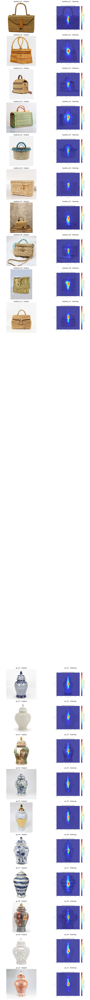

In [19]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import math

# Rutas
output_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2" # donde están los heatmaps generados
originals_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"

# Buscar imágenes heatmap
heatmap_files = [f for f in os.listdir(output_folder) if f.endswith('_heatmap.png')]
heatmap_files.sort()

# Grilla: 2 columnas por imagen (original + heatmap)
n_images = len(heatmap_files)
n_cols = 2
n_rows = n_images

plt.figure(figsize=(12, n_rows * 4))

for i, heatmap_filename in enumerate(heatmap_files):
    # Obtener nombre base sin "_heatmap.png"
    base_name = heatmap_filename.replace('_heatmap.png', '')
    original_path = os.path.join(originals_folder, f"{base_name}.jpg")
    heatmap_path = os.path.join(output_folder, heatmap_filename)
    
    # Cargar imágenes
    if os.path.exists(original_path) and os.path.exists(heatmap_path):
        original_img = mpimg.imread(original_path)
        heatmap_img = mpimg.imread(heatmap_path)

        # Mostrar imagen original
        ax1 = plt.subplot(n_rows, n_cols, i * 2 + 1)
        ax1.imshow(original_img)
        ax1.set_title(f"{base_name} - Original")
        ax1.axis('off')

        # Mostrar heatmap
        ax2 = plt.subplot(n_rows, n_cols, i * 2 + 2)
        ax2.imshow(heatmap_img)
        ax2.set_title(f"{base_name} - Heatmap")
        ax2.axis('off')

plt.tight_layout()
plt.show()


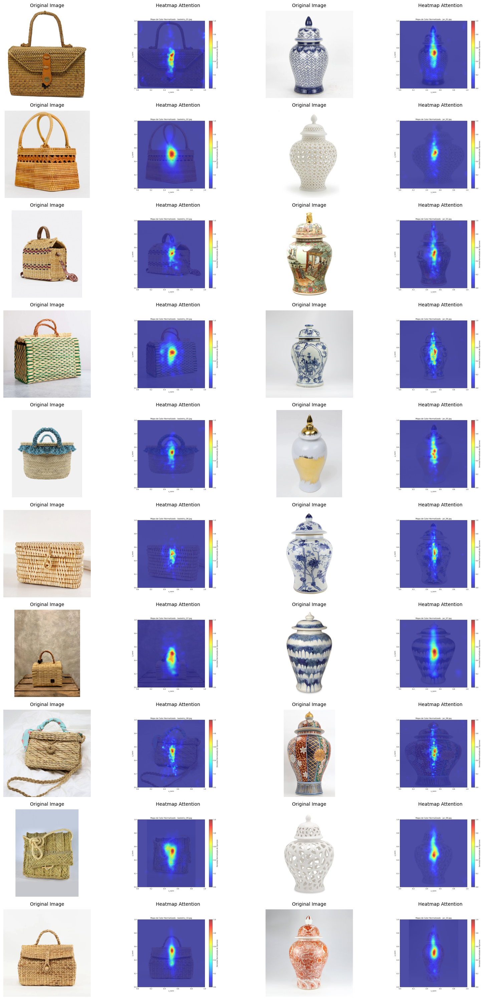

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import numpy as np

# Carpetas
originals_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"
heatmaps_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2"

# Nombres base
basketry = [f"basketry_{str(i).zfill(2)}" for i in range(1, 11)]
jar    = [f"jar_{str(i).zfill(2)}" for i in range(1, 11)]

# Número de filas
n_rows = len(basketry)
fig, axes = plt.subplots(n_rows, 4, figsize=(16, n_rows * 3))

# Recorremos imágenes
for idx, (ces, jar) in enumerate(zip(basketry, jar)):
    # Rutas
    ces_img_path = os.path.join(originals_folder, f"{ces}.jpg")
    ces_heatmap_path = os.path.join(heatmaps_folder, f"{ces}_heatmap.png")
    
    jar_img_path = os.path.join(originals_folder, f"{jar}.jpg")
    jar_heatmap_path = os.path.join(heatmaps_folder, f"{jar}_heatmap.png")

    # Carga
    ces_img = mpimg.imread(ces_img_path)
    ces_heat = mpimg.imread(ces_heatmap_path)
    jar_img = mpimg.imread(jar_img_path)
    jar_heat = mpimg.imread(jar_heatmap_path)

    # Mostrar en grilla
    for col, img, label in zip(range(4), [ces_img, ces_heat, jar_img, jar_heat],
                               ["Original Image", "Heatmap Attention"] * 2):
        axes[idx, col].imshow(img)
        axes[idx, col].set_title(label, fontsize=10, pad=8)
        axes[idx, col].axis("off")

plt.tight_layout()
plt.show()


In [22]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, ImageOps
import numpy as np

def pad_to_square(img, background_color=(255, 255, 255)):
    """Encapsula la imagen en un lienzo cuadrado, centrado, con fondo blanco."""
    width, height = img.size
    max_dim = max(width, height)
    new_img = Image.new("RGB", (max_dim, max_dim), background_color)
    offset = ((max_dim - width) // 2, (max_dim - height) // 2)
    new_img.paste(img, offset)
    return new_img

# Carpetas
originals_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"
heatmaps_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2"
output_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\comparaciones_individuales"
os.makedirs(output_folder, exist_ok=True)

# Lista de nombres
cesteria = [f"basketry_{str(i).zfill(2)}" for i in range(1, 11)]
jarra = [f"jar_{str(i).zfill(2)}" for i in range(1, 11)]
todas = cesteria + jarra

# Procesar
for nombre in todas:
    try:
        original_path = os.path.join(originals_folder, f"{nombre}.jpg")
        heatmap_path = os.path.join(heatmaps_folder, f"{nombre}_heatmap.png")

        # Cargar imágenes
        original_img = Image.open(original_path).convert("RGB")
        heatmap_img = Image.open(heatmap_path).convert("RGB")

        # Encapsular la imagen original en un cuadrado y redimensionar al tamaño del heatmap
        padded_original = pad_to_square(original_img)
        resized_original = padded_original.resize(heatmap_img.size)

        # Convertir a arrays
        original_array = np.array(resized_original)
        heatmap_array = np.array(heatmap_img)

        # Crear figura
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        axs[0].imshow(original_array)
        axs[0].set_title("Original Image", fontsize=14, pad=15)

        axs[1].imshow(heatmap_array)
        axs[1].set_title("Heatmap attention", fontsize=14, pad=15)

        for ax in axs:
            ax.axis("off")

        fig.suptitle(nombre, fontsize=16, y=1.02)
        plt.tight_layout()

        output_path = os.path.join(output_folder, f"{nombre}_comparacion.png")
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        plt.close()
        print(f"✅ Guardado: {output_path}")

    except Exception as e:
        print(f"❌ Error procesando {nombre}: {e}")


✅ Guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\comparaciones_individuales\basketry_01_comparacion.png
✅ Guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\comparaciones_individuales\basketry_02_comparacion.png
✅ Guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\comparaciones_individuales\basketry_03_comparacion.png
✅ Guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\comparaciones_individuales\basketry_04_comparacion.png
✅ Guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\comparaciones_individuales\basketry_05_comparacion.png
✅ Guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\comparaciones_individuales\basketry_06_comparacion.png
✅ Guardado: C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\comparaciones_individuales\basketry_07_comparacion.png
✅ Guardado: C

# Calcular la media y la desviacion estandar de los heatmap de cada imagen

In [23]:
import os
import numpy as np
import pandas as pd
import glob

# Ruta de los heatmaps generados
folder_heatmaps = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2"

# Buscar todos los archivos que terminan en "_heatmap.csv"
csv_files = glob.glob(os.path.join(folder_heatmaps, "*_heatmap.csv"))

# Lista para guardar estadísticas
estadisticas = []

for file in csv_files:
    try:
        data = np.loadtxt(file, delimiter=",")
        media = np.mean(data)
        desviacion = np.std(data)

        nombre_img = os.path.basename(file).replace("_heatmap.csv", "")
        estadisticas.append({
            "Imagen": nombre_img,
            "Media": round(media, 6),
            "Desviación estándar": round(desviacion, 6)
        })

    except Exception as e:
        print(f"❌ Error con {file}: {e}")

# Crear DataFrame ordenado
df_estadisticas = pd.DataFrame(estadisticas).sort_values("Imagen").reset_index(drop=True)

# Mostrar en consola
print("\n" + "="*65)
print("              DISTRIBUCIÓN_HEATMAP_PARTICIPANTES")
print("="*65)
print(df_estadisticas.to_string(index=False))

# Guardar como CSV
output_path = os.path.join(folder_heatmaps, "estadisticas_heatmaps_participantes.csv")
df_estadisticas.to_csv(output_path, index=False)
print(f"\n✅ Archivo CSV guardado en:\n{output_path}")



              DISTRIBUCIÓN_HEATMAP_PARTICIPANTES
     Imagen    Media  Desviación estándar
basketry_01 0.026913             0.083043
basketry_02 0.035613             0.103696
basketry_03 0.019448             0.067618
basketry_04 0.034503             0.095474
basketry_05 0.019827             0.069410
basketry_06 0.017039             0.062829
basketry_07 0.032434             0.104275
basketry_08 0.022632             0.071331
basketry_09 0.033031             0.102981
basketry_10 0.022784             0.079028
cesteria_01 0.026913             0.083043
cesteria_02 0.035613             0.103696
cesteria_03 0.019448             0.067618
cesteria_04 0.034503             0.095474
cesteria_05 0.019827             0.069410
cesteria_06 0.017039             0.062829
cesteria_07 0.032434             0.104275
cesteria_08 0.022632             0.071331
cesteria_09 0.033031             0.102981
cesteria_10 0.022784             0.079028
     jar_01 0.029276             0.090828
     jar_02 0.019868      

### Muestra 20 pares (original + heatmap) en 5 filas × 8 columnas (4 pares por fila) - heatmap promedio + imagen original de los participantes

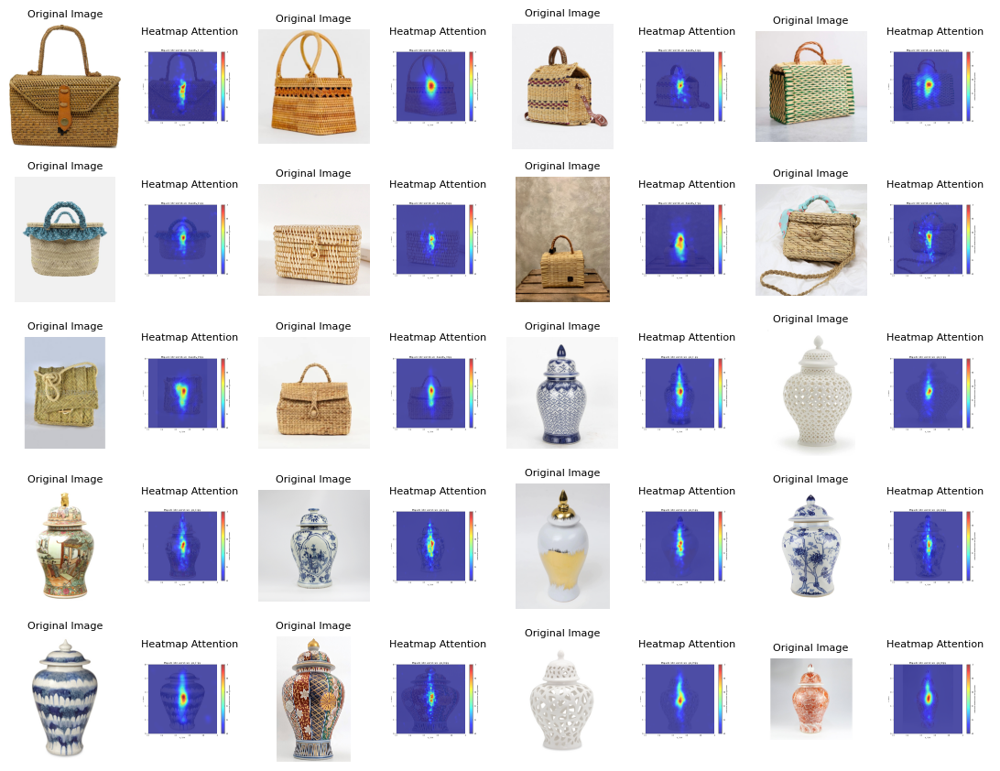

In [26]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Carpetas
originals_folder = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\imagenes_experimento_001"
heatmaps_folder  = r"C:\Users\UsuarioCompuElite\Desktop\Tesis_doctorado\Articulo_1\metodologia\Resultados_finales2"

# Nombres base
basketry = [f"basketry_{str(i).zfill(2)}" for i in range(1, 11)]
jar    = [f"jar_{str(i).zfill(2)}" for i in range(1, 11)]

# Unir listas y agrupar en pares (original, heatmap)
imagenes = []
for nombre in basketry + jar:
    orig_path = os.path.join(originals_folder, f"{nombre}.jpg")
    heat_path = os.path.join(heatmaps_folder, f"{nombre}_heatmap.png")
    imagenes.append((orig_path, heat_path))

# Configuración de grilla: 8 columnas (original + heatmap) => 4 pares por fila
cols = 8
rows = len(imagenes) // 4  # 4 pares por fila

fig, axes = plt.subplots(rows, cols, figsize=(11, 8.5))  # Tamaño carta en pulgadas (8.5 x 11")
axes = axes.reshape(rows, cols)  # Asegurar el formato correcto

for i, (orig_path, heat_path) in enumerate(imagenes):
    row = i // 4
    col = (i % 4) * 2

    # Leer imágenes
    orig_img = mpimg.imread(orig_path)
    heat_img = mpimg.imread(heat_path)

    # Mostrar original
    axes[row, col].imshow(orig_img)
    axes[row, col].set_title("Original Image", fontsize=8)
    axes[row, col].axis("off")

    # Mostrar heatmap
    axes[row, col + 1].imshow(heat_img)
    axes[row, col + 1].set_title("Heatmap Attention", fontsize=8)
    axes[row, col + 1].axis("off")

plt.tight_layout(pad=1)
plt.savefig("C:/Users/UsuarioCompuElite/Desktop/Tesis_doctorado/Articulo_1/figura_8columnas.png", dpi=300)
plt.show()
